In [1]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
from IPython.display import HTML
import base64

mp4 = open('../data/squat/reference_squat_3X.mp4', 'rb').read()
data_url = 'data:video/mp4;base64,' + base64.b64encode(mp4).decode()
HTML("""<video width=600 controls>
      <source src="%s" type="video/mp4"></video>
  """ % data_url)

In [10]:
joints = pd.read_csv("../results/reference_squat_X3/joints.csv")
left_knee_positions = joints[joints['joint_id'] == 25]
right_knee_positions = joints[joints['joint_id'] == 26]

angles = pd.read_csv("../results/reference_squat_X3/angles.csv")

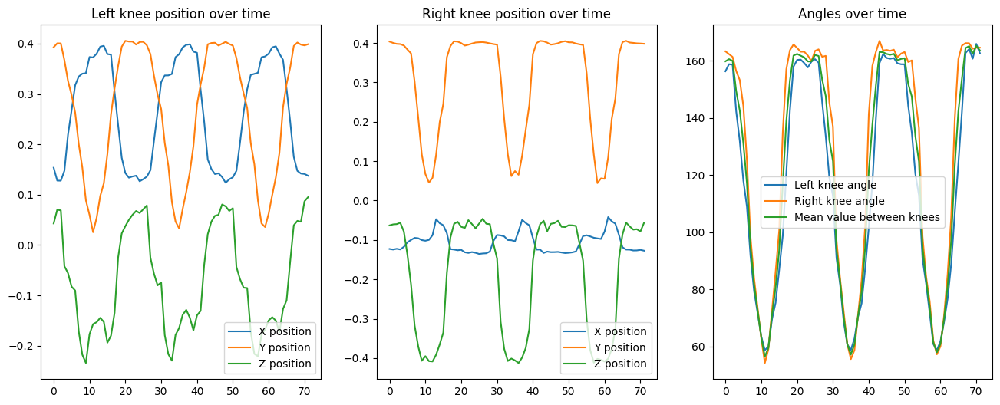

In [11]:
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(16, 6))
frames = angles['frame']

ax[0].set_title('Left knee position over time')
ax[0].plot(frames, left_knee_positions['x'], label='X position')
ax[0].plot(frames, left_knee_positions['y'], label='Y position')
ax[0].plot(frames, left_knee_positions['z'], label='Z position')
ax[0].legend()

ax[1].set_title('Right knee position over time')
ax[1].plot(frames, right_knee_positions['x'], label='X position')
ax[1].plot(frames, right_knee_positions['y'], label='Y position')
ax[1].plot(frames, right_knee_positions['z'], label='Z position')
ax[1].legend()

ax[2].set_title('Angles over time')
ax[2].plot(frames, angles['left_knee'], label='Left knee angle')
ax[2].plot(frames, angles['right_knee'], label='Right knee angle')
ax[2].plot(frames, angles[['left_knee', 'right_knee']].mean(axis=1), label='Mean value between knees')
ax[2].legend()

### Time series segmentation

1. We choose n parameters, that have biggest deviation in exercise performence.
2. We sum them together - Now we have signal of the performance.
3. We use sliding window (size depends on FPS) to extract features - deviation and max/min value in window.
4. If deviation is very low and bove/below mean signal value the middle point is detected as bottom or up position.

In [12]:
important_features = angles.drop('frame', axis=1).std().sort_values(ascending=False)[:4].keys()
important_angles_df = angles[important_features]

In [13]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler() 
important_angles_normalized_df = scaler.fit_transform(important_angles_df)
exercise_signal = important_angles_normalized_df.sum(axis=1)
zero_point = exercise_signal.mean()

Text(0.5, 0, 'Frames')

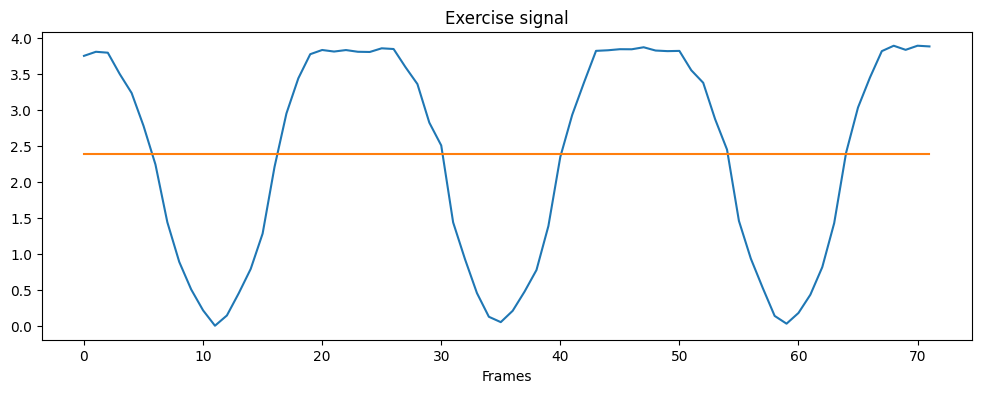

In [14]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(12, 4))
ax.plot(exercise_signal)

ax.plot((zero_point,) * exercise_signal.shape[0])
ax.set_title("Exercise signal")
ax.set_xlabel("Frames")

In [15]:
sliding_window_size = 5
stride = 1
tolerance = 0.1

In [16]:
breakpoints = []
reps = 0
state = 'up'

for idx in range(0, len(exercise_signal) - sliding_window_size + 1, stride):
    window = exercise_signal[idx:idx + sliding_window_size]

    if state == 'up':
        if abs(np.std(window) - 0.1) < tolerance and np.mean(window) < zero_point:
            state = 'down'
            breakpoints.append(idx + sliding_window_size // 2)

    elif state == 'down':
        if abs(np.std(window) - 0.1) < tolerance and np.mean(window) > zero_point:
            state = 'up'
            breakpoints.append(idx + sliding_window_size // 2)